In [2]:
import keras_cv
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from glob import glob
import tensorflow.experimental.numpy as tnp
from keras_cv.models.stable_diffusion.noise_scheduler import NoiseScheduler
from tqdm import tqdm
import cv2
from tqdm import trange
from sklearn.decomposition import PCA
import matplotlib as mpl

from IPython.display import Image as IImage
from PIL import Image
import imageio

In [3]:
CROP = 512

StableDiffusion = keras_cv.models.StableDiffusion(img_height=CROP, img_width=CROP,jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


# Moving in latent space

## Aging

In [68]:
prompts_woman = []

for age in np.arange(18,90,1):
    prompts_woman.append(f"A happy {age} years old woman posing for a photo to put in his cv")
    
prompts_man = []

for age in np.arange(18,90,1):
    prompts_man.append(f"A happy {age} years old man posing for a photo to put in his cv")

    
w = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_woman]))
w = w.reshape(len(w),np.prod(w.shape[1:]))

m = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_man]))
m = m.reshape(len(m),np.prod(m.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(w,axis=-1),axis=-1)
std = np.expand_dims(np.std(w,axis=-1),axis=-1)
pca.fit((np.copy(w)-mean)/std)
a = pca.transform((np.copy(w)-mean)/std)

age_direction = pca.components_

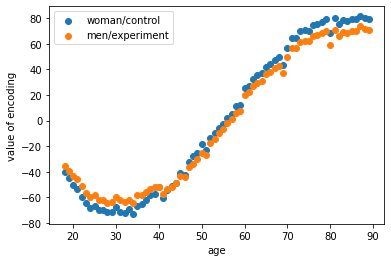

In [71]:
plt.scatter(np.arange(18,90,1),a.flatten(),label='woman/control')
plt.scatter(np.arange(18,90,1),np.sum(np.multiply(pca.components_,m),axis=-1),label='men/experiment')
plt.xlabel('age')
plt.ylabel('value of encoding')
plt.legend()
plt.show()

In [ ]:
prompt_m = 'A happy 20 years old man'
prompt_w = 'A happy 20 years old woman'

encoding_m = StableDiffusion.encode_text(prompt_m)
encoding_w = StableDiffusion.encode_text(prompt_w)

steps = 5
coeff = np.linspace(0,60,steps)

interpolation_m = [encoding_m + c*age_direction.reshape(encoding_m.shape) for c in coeff]
interpolation_w = [encoding_w + c*age_direction.reshape(encoding_w.shape) for c in coeff]


seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)


images_m = StableDiffusion.generate_image(
    interpolation_m,
    batch_size=len(interpolation_m),
    diffusion_noise = noise_seed
)


images_w = StableDiffusion.generate_image(
    interpolation_w,
    batch_size=len(interpolation_w),
    diffusion_noise = noise_seed
)


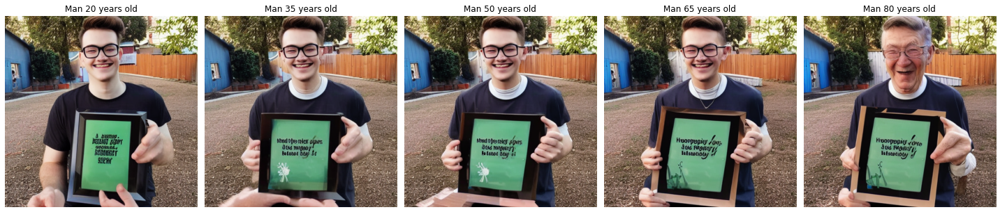

In [97]:
fig,axs = plt.subplots(ncols=len(images_m),figsize=(20,5))

for i in range(len(images_m)):
    axs[i].imshow(images_m[i])
    axs[i].axis('off')
    axs[i].set_title(f'Man {int(20+coeff[i])} years old')
    

plt.tight_layout()    
plt.show()

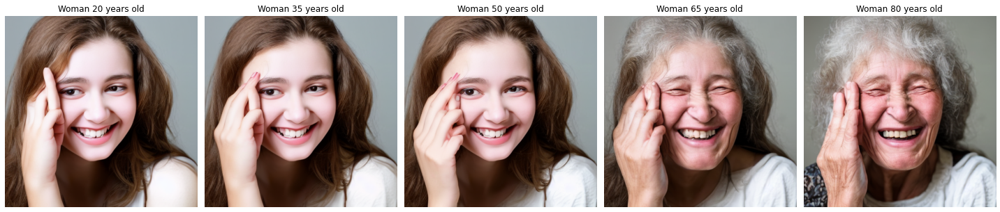

In [87]:
fig,axs = plt.subplots(ncols=len(images_w),figsize=(20,5))

for i in range(len(images_w)):
    axs[i].imshow(images_w[i])
    axs[i].axis('off')
    axs[i].set_title(f'Woman {int(20+coeff[i])} years old')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 722ms/step


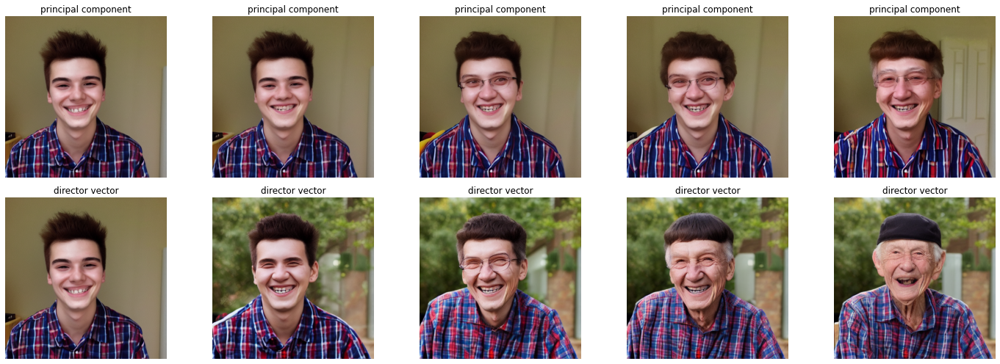

In [156]:
prompt_1 = 'A happy 20 years old woman'
prompt_2 = 'A happy 80 years old woman'
interpolation_steps = 5

encoding_1 = tf.squeeze(StableDiffusion.encode_text(prompt_1))
encoding_2 = tf.squeeze(StableDiffusion.encode_text(prompt_2))

interpolation = tf.linspace(encoding_1, encoding_2, interpolation_steps)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

age_direction_difference = interpolation[-1] - interpolation[0]


prompt_1 = 'A happy 20 years old man'
interpolation_steps = 5
interpolation_pca,interpolation_difference = [],[]

encoding = tf.squeeze(StableDiffusion.encode_text(prompt_1))
coeffs_pca,coeffs_diff = np.linspace(0,60,interpolation_steps),np.linspace(0,1,interpolation_steps)

for c in range(interpolation_steps):

    p2 = encoding + coeffs_pca[c]*age_direction.reshape(encoding.shape)
    interpolation_pca.append(np.copy(p2))
    
    p2 = encoding + coeffs_diff[c]*age_direction_difference
    interpolation_difference.append(np.copy(p2))


images_pca = StableDiffusion.generate_image(
    interpolation_pca,
    batch_size=len(interpolation_pca),
    diffusion_noise = noise_seed
)

images_difference = StableDiffusion.generate_image(
    interpolation_difference,
    batch_size=len(interpolation_difference),
    diffusion_noise = noise_seed
)

images_pca = StableDiffusion.generate_image(
    interpolation_pca,
    batch_size=len(interpolation_pca),
    diffusion_noise = noise_seed
)

images_difference = StableDiffusion.generate_image(
    interpolation_difference,
    batch_size=len(interpolation_difference),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),nrows = 2,figsize=(20,7))

for i in range(len(images_pca)):
    axs[0,i].imshow(images_pca[i])
    axs[0,i].axis('off')
    axs[0,i].set_title('principal component')
    
    axs[1,i].imshow(images_difference[i])
    axs[1,i].axis('off')
    axs[1,i].set_title('director vector')
    

plt.tight_layout()    
plt.show()

## Clothing color

In [140]:
colors = list(mpl.colors.cnames.keys())

prompts_woman = []
prompts_man = []

for color in colors:
    prompts_woman.append(f"A happy woman with a {color} shirt")
    
for color in colors:
    prompts_man.append(f"A happy man with a {color} shirt")

    
w = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_woman]))
w = w.reshape(len(w),np.prod(w.shape[1:]))
m = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_man]))
m = m.reshape(len(m),np.prod(m.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(w,axis=-1),axis=-1)
std = np.expand_dims(np.std(w,axis=-1),axis=-1)
pca.fit((np.copy(w)-mean)/std)
a = pca.transform((np.copy(w)-mean)/std)

colors[np.argmin(a.flatten())],colors[np.argmax(a.flatten())]
color_direction = pca.components_

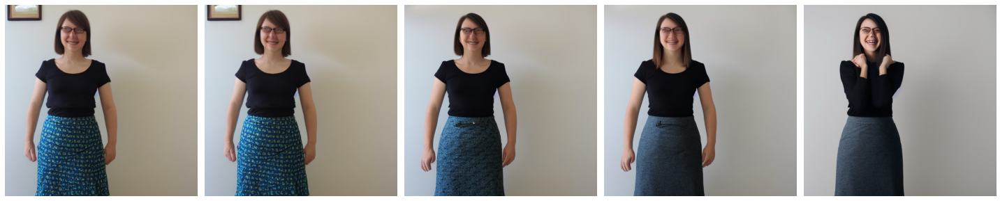

In [172]:
p1 = f"A happy woman with a {colors[np.argmin(a.flatten())]} skirt"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in np.linspace(0,np.amax(a.flatten())-np.amin(a.flatten()),4):

    p2 = encoding + c*color_direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)


seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)



fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

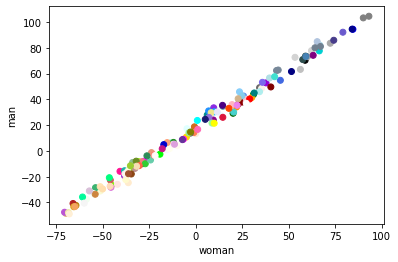

In [173]:
plt.scatter(a.flatten(),np.sum(np.multiply(pca.components_,m),axis=-1),color=colors)
plt.xlabel('woman')
plt.ylabel('man')
plt.show()

## Hair

50/50 [==============================] - 36s 716ms/step


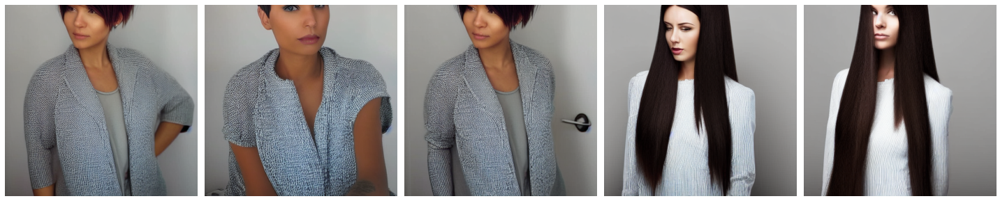

In [389]:
prompts_cp = []
prompts_ts = []

places = ['Libson','Madrid','Paris','Berlin','Rome','New York','Central Park','Times Square',
         'Eiffel Tower','Statue of Liberty','the park','the zoo','the aquarium','the beach',
         'the jungle','the desert','London']

for place in places:
    for long in ['very short', 'short','medium long','long','very long','incredibly long']:
        prompts_cp.append(f"A woman with {long} hair in {place}")
        
        
for place in places:
    for long in ['very short', 'short','medium long','long','very long','incredibly long']:
        prompts_ts.append(f"A man with {long} hair in {place}")
    
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction = pca.components_

p1 = f"A woman with very short hair"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 5*len(prompts_cp)//4*np.linspace(-1.5,0.5,4)[::-1]:

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))

interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 710ms/step


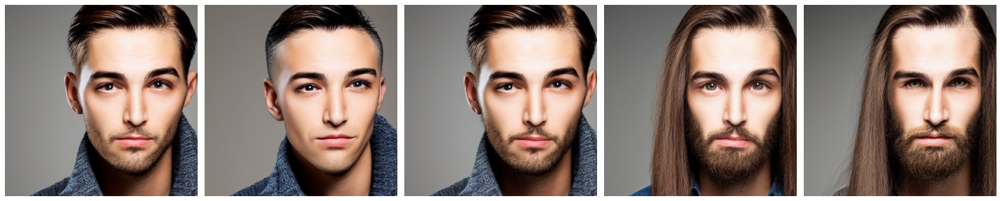

In [393]:
p1 = f"A man with very short hair"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 5*len(prompts_cp)//4*np.linspace(-1.5,0.5,4)[::-1]:

    p2 = encoding + c*direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))

interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()

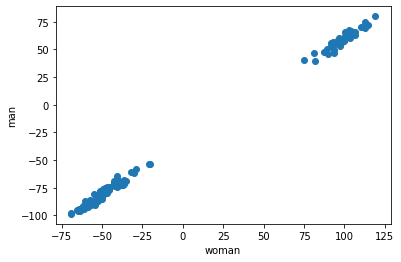

In [386]:
plt.scatter(a.flatten(),np.sum(np.multiply(pca.components_,ts),axis=-1))
plt.xlabel('woman')
plt.ylabel('man')
plt.show()

# Landscapes

50/50 [==============================] - 36s 721ms/step


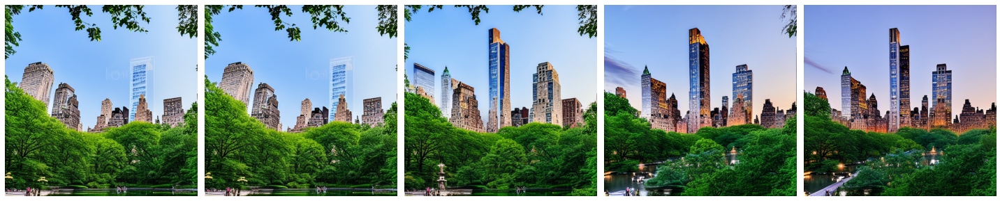

In [111]:
prompts_cp = []
prompts_ts = []
hours = [f'0{i}' for i in range(10)]
hours = np.concatenate((hours,[f'{i}' for i in range(10,24)]))
minutes = [f'0{i}' for i in range(10)]
minutes = np.concatenate((minutes,[f'{i}' for i in range(10,60)]))

for hour in hours:
    for minute in minutes:
        prompts_cp.append(f"Central Park, New York at {hour}:{minute} on July 15th")
        prompts_ts.append(f"Times Square, New York at {hour}:{minute} on July 15th")

cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca_hours = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca_hours.fit((np.copy(cp)-mean)/std)

direction_hours = pca_hours.components_

p1 = f"Central Park, New York at 06:00 on July 15th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 20*np.arange(4):

    p2 = encoding + c*direction_hours.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 717ms/step


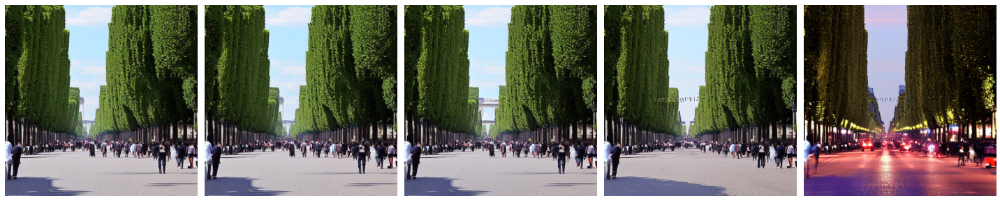

In [118]:
p1 = f"Champs Elysees, Paris at 09:00 on July 15th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in 20*np.arange(4):

    p2 = encoding + c*direction_hours.reshape(encoding.shape)
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 721ms/step


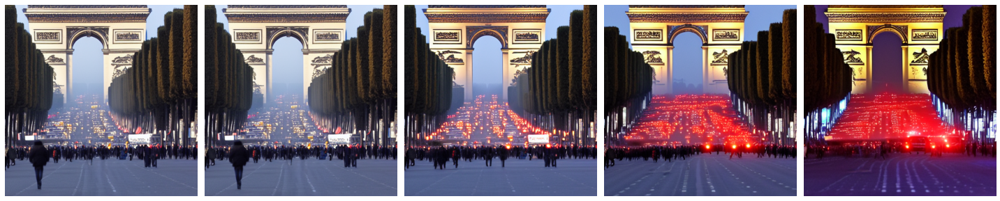

In [129]:
prompts_cp = []
prompts_ts = []
months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for month in months:
    for day in range(1,29):
        prompts_cp.append(f"Central Park, New York at 09:00 am on {month} {day}th")
        prompts_ts.append(f"Times Square, New York at 09:00 am on {month} {day}th")
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca_months = PCA(n_components = 1)

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca_months.fit((np.copy(cp)-mean)/std)

direction_months = pca_months.components_


p1 = f"Champs Elysees, Paris at 09:00 on January 1th"
encoding = StableDiffusion.encode_text(p1)
interpolation = [encoding]

for c in np.arange(4):

    p2 = encoding + c*(20*direction_hours.reshape(encoding.shape) + 10*direction_months.reshape(encoding.shape))
    interpolation.append(np.copy(p2))
    
interpolation = np.array(interpolation)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),figsize=(20,5))

for i in range(len(images)):
    axs[i].imshow(images[i])
    axs[i].axis('off')
    

plt.tight_layout()    
plt.show()

50/50 [==============================] - 36s 721ms/step


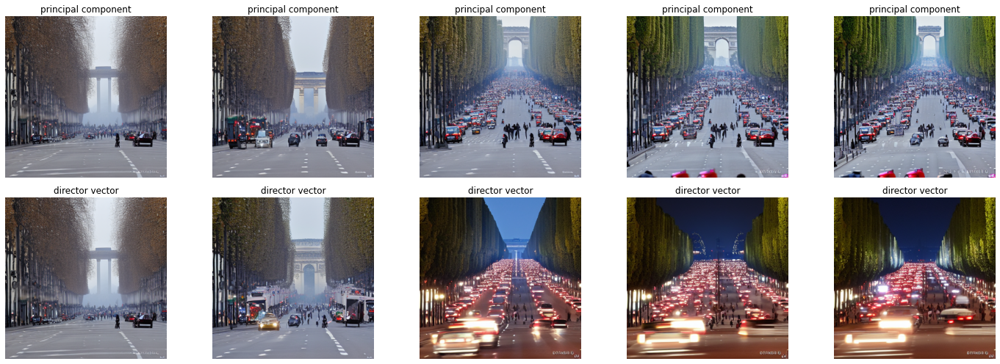

In [161]:
prompt_1 = "Central Park, New York at 09:00 am on January 15th"
prompt_2 = "Central Park, New York at 09:00 pm on July 15th"
interpolation_steps = 5

encoding_1 = tf.squeeze(StableDiffusion.encode_text(prompt_1))
encoding_2 = tf.squeeze(StableDiffusion.encode_text(prompt_2))

interpolation = tf.linspace(encoding_1, encoding_2, interpolation_steps)

seed = 12345
noise_seed = tf.random.normal((512 // 8, 512 // 8, 4), seed=seed)

direction_difference = interpolation[-1] - interpolation[0]


prompt_1 = f"Champs Elysees, Paris at 09:00 am on January 15th"
interpolation_steps = 5
interpolation_pca,interpolation_difference = [],[]

encoding = tf.squeeze(StableDiffusion.encode_text(prompt_1))
coeffs_pca,coeffs_diff = np.linspace(0,60,interpolation_steps),np.linspace(0,1,interpolation_steps)

for c in range(interpolation_steps):

    p2 = encoding + coeffs_pca[c]*direction_months.reshape(encoding.shape)
    interpolation_pca.append(np.copy(p2))
    
    p2 = encoding + coeffs_diff[c]*direction_difference
    interpolation_difference.append(np.copy(p2))



images_pca = StableDiffusion.generate_image(
    interpolation_pca,
    batch_size=len(interpolation_pca),
    diffusion_noise = noise_seed
)

images_difference = StableDiffusion.generate_image(
    interpolation_difference,
    batch_size=len(interpolation_difference),
    diffusion_noise = noise_seed
)

fig,axs = plt.subplots(ncols=len(images),nrows = 2,figsize=(20,7))

for i in range(len(images_pca)):
    axs[0,i].imshow(images_pca[i])
    axs[0,i].axis('off')
    axs[0,i].set_title('principal component')
    
    axs[1,i].imshow(images_difference[i])
    axs[1,i].axis('off')
    axs[1,i].set_title('director vector')
    

plt.tight_layout()    
plt.show()

# Modifying my photo

## Glasses

In [5]:
prompts_cp = []
prompts_ts = []

places = ['Libson','Madrid','Paris','Berlin','Rome','New York','Central Park','Times Square',
         'Eiffel Tower','Statue of Liberty','the park','the zoo','the aquarium','the beach',
         'the jungle','the desert','London']

months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for place in places:
    for month in months:
        prompts_cp.append(f"A young woman of 25 years old in {place} on {month}")
        prompts_cp.append(f"A young man of 25 years old in {place} on {month}")
        
        
for place in places:
    for month in months:
        prompts_ts.append(f"A young woman of 25 years old wearing glasses in {place} on {month}")
        prompts_ts.append(f"A young man of 25 years old wearing glasses in {place} on {month}")
        
        #prompts_ts.append(f"A brown young woman of 25 years old in {place} on {month}")
        #prompts_ts.append(f"A brown young man of 25 years old in {place} on {month}")
        
        
    
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

cp = np.concatenate((cp,ts))

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction_glasses = pca.components_

## Skin color

In [6]:
prompts_cp = []
prompts_ts = []

places = ['Libson','Madrid','Paris','Berlin','Rome','New York','Central Park','Times Square',
         'Eiffel Tower','Statue of Liberty','the park','the zoo','the aquarium','the beach',
         'the jungle','the desert','London']

months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for place in places:
    for month in months:
        prompts_cp.append(f"A white young woman of 25 years old in {place} on {month}")
        prompts_cp.append(f"A white young man of 25 years old in {place} on {month}")

        
        
for place in places:
    for month in months:
        prompts_ts.append(f"A brown young woman of 25 years old in {place} on {month}")
        prompts_ts.append(f"A brown young man of 25 years old in {place} on {month}")

        
    
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

cp = np.concatenate((cp,ts))

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction_skin_color = pca.components_

## Boy to man

In [7]:
prompts_cp = []
prompts_ts = []

places = ['Libson','Madrid','Paris','Berlin','Rome','New York','Central Park','Times Square',
         'Eiffel Tower','Statue of Liberty','the park','the zoo','the aquarium','the beach',
         'the jungle','the desert','London']

months = ['January','February','March',
          'April','May','June','July','August',
          'September','October','November','December']

for place in places:
    for month in months:
        prompts_cp.append(f"A little girl of 5 years old in {place} on {month}")
        prompts_cp.append(f"A little boy of 5 years old in {place} on {month}")
        
        
for place in places:
    for month in months:
        prompts_ts.append(f"A young woman of 25 years old in {place} on {month}")
        prompts_ts.append(f"A young man of 25 years old in {place} on {month}")
    
        
cp = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_cp]))
cp = cp.reshape(len(cp),np.prod(cp.shape[1:]))

ts = np.squeeze(np.array([StableDiffusion.encode_text(p) for p in prompts_ts]))
ts = ts.reshape(len(ts),np.prod(ts.shape[1:]))

pca = PCA(n_components = 1)

cp = np.concatenate((cp,ts))

mean = np.expand_dims(np.mean(cp,axis=-1),axis=-1)
std = np.expand_dims(np.std(cp,axis=-1),axis=-1)
pca.fit((np.copy(cp)-mean)/std)
a = pca.transform((np.copy(cp)-mean)/std)

direction_growing = pca.components_

## My photo

In [8]:
import matplotlib.pylab as pl
import ot
import ot.plot

In [15]:
photos = np.array([cv2.cvtColor(cv2.resize(cv2.imread('./child.png'),(CROP,CROP)), cv2.COLOR_BGR2RGB)])

n = 100
x = np.arange(n, dtype=np.float64)

b = np.random.normal(0,1,100000)
b = np.histogram(b,bins=n,density=True)
b_bins = np.copy(b[1])
a = np.histogram(np.ndarray.flatten(photos[0])/255,bins=b[1],density=True)[0]
a = a/np.sum(a)
b = b[0]
b = b/np.sum(b)

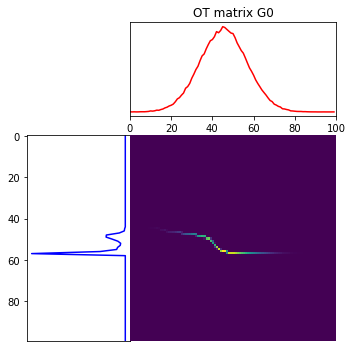

In [16]:
G0 = ot.emd_1d(x, x, a, b)

pl.figure(3, figsize=(5, 5))
ot.plot.plot1D_mat(a, b, G0, 'OT matrix G0')

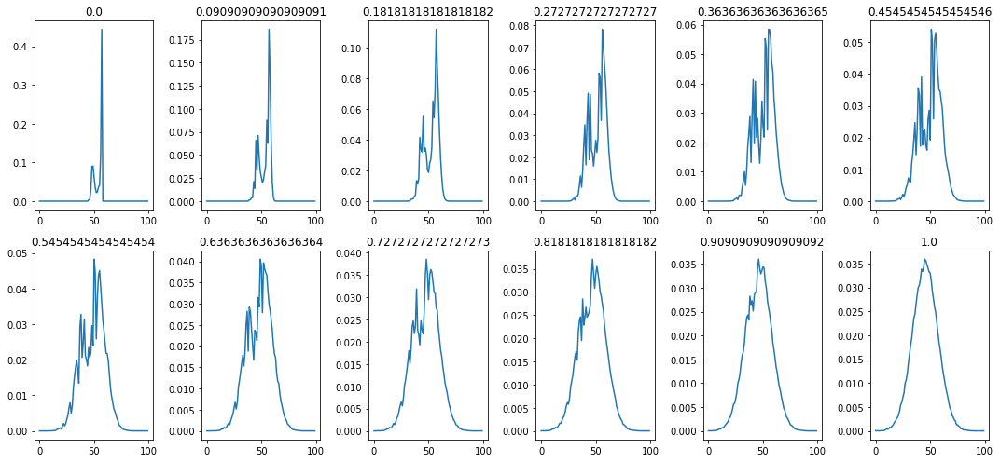

In [17]:
fig,axs = plt.subplots(ncols=6,nrows=2,figsize=(15,7))


for i,t in enumerate(np.linspace(0,1,12)):
    m = cv2.getRotationMatrix2D((n//2, n//2),90*(1-t),1)
    gamma = cv2.warpAffine(G0, m, (n,n), None, cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    dist = np.sum(gamma,axis=0)
    dist = dist/np.sum(dist)
    axs[i//6,i%6].plot(dist)
    axs[i//6,i%6].set_title(f'{t}')
    
plt.tight_layout()
plt.show()

50/50 [==============================] - 49s 986ms/step


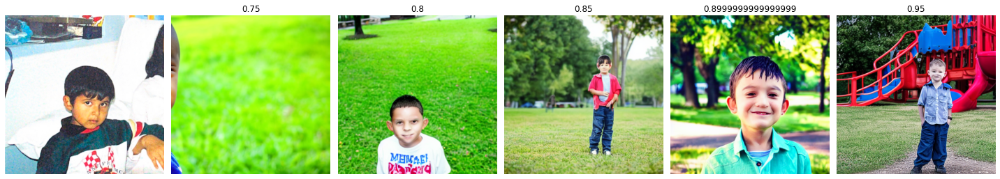

In [27]:
p1 = f"A little boy of 5 years old at the park posing for a photo for his cv"
encoding = StableDiffusion.encode_text(p1)

direction = -2*direction_growing + 0.75*direction_skin_color + direction_glasses

interpolation = []
noise = []
T = []

for t in np.linspace(0.75,0.95,5):

    m = cv2.getRotationMatrix2D((n//2, n//2),90*(1-t),1)
    gamma = cv2.warpAffine(G0, m, (n,n), None, cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
    dist = np.sum(gamma,axis=0)
    dist = dist/np.sum(dist)

    noi = np.random.choice(b_bins[:-1],p=dist,size=(512 // 8, 512 // 8, 4))

    noise.append(np.copy(noi))
    interpolation.append(encoding)
    T.append(t)
    
noise = np.array(noise)
interpolation = np.array(interpolation)
T = np.array(T)


images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise
)

fig,axs = plt.subplots(ncols=len(images)+1,figsize=(20,5))
axs[0].imshow(photos[0])
axs[0].axis('off')

for i in range(1,len(images)+1):
    axs[i].imshow(images[i-1])
    axs[i].axis('off')
    axs[i].set_title(str(T[i-1]))


plt.tight_layout()    
plt.show()

50/50 [==============================] - 21s 419ms/step


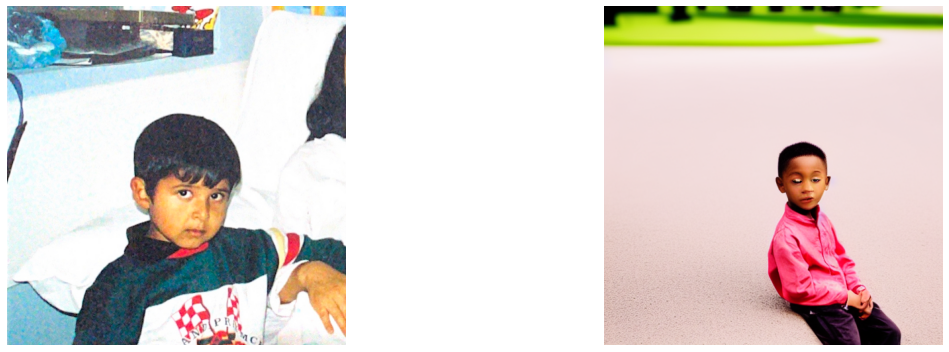

In [127]:
p1 = f"A little boy of 5 years old at the park posing for a photo for his cv"
encoding = StableDiffusion.encode_text(p1)

direction = -2*direction_growing + 0.75*direction_skin_color + direction_glasses

interpolation = np.array([encoding])



images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise
)

fig,axs = plt.subplots(ncols=len(images)+1,figsize=(20,5))
axs[0].imshow(photos[0])
axs[0].axis('off')

for i in range(1,len(images)+1):
    axs[i].imshow(images[i-1])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()

50/50 [==============================] - 49s 980ms/step


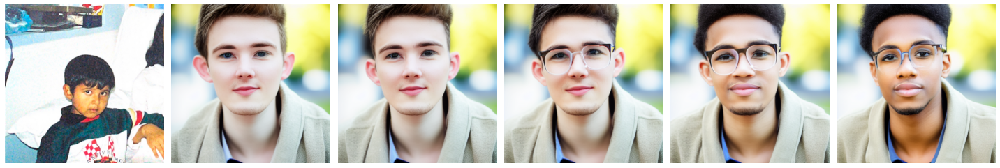

In [129]:
seed = 12345
noise_seed = np.load('./saved_noises/2.npy')
alpha = 0.05
noise = StableDiffusion.image_encoder(photos)

noise = alpha*noise + (1-alpha)*noise_seed

p1 = f"A little boy of 5 years old at the park posing for a photo for his cv"
encoding = StableDiffusion.encode_text(p1)


interpolation = []

for c in np.linspace(-50,50,5):

    direction = -200*direction_growing + c*direction_skin_color + 100*direction_glasses

    p2 = encoding + direction.reshape(encoding.shape)
    interpolation.append(np.copy(p2))

interpolation = np.array(interpolation)


images = StableDiffusion.generate_image(
    interpolation,
    batch_size=len(interpolation),
    diffusion_noise = noise
)

fig,axs = plt.subplots(ncols=len(images)+1,figsize=(20,5))
axs[0].imshow(photos[0])
axs[0].axis('off')

for i in range(1,len(images)+1):
    axs[i].imshow(images[i-1])
    axs[i].axis('off')


plt.tight_layout()    
plt.show()